# INVENTORY DAYS - Challengue was taken by MFrancys

#### Below I present my proposal to answer this business problem by developing and implementing the following Machine Learning Pipeline, which follows the following steps and techniques to apply in each of them:
<img src="images/machine_learning_pipeline.png">


#### In the same way, below I show a diagram of the data flow used to build the pipeline:
<img src="images/data_flow.png">

#### Finally, in the following link you will find a brief summary of a set of proposals to improve the model in the future and the machine learning pipeline implement: https://www.notion.so/INVENTORY-DAYS-Challengue-was-taken-by-MFrancys-050c8794ee1245aaaff13184ecea864d

#### In the original code the MAPE is approximately 1.3434004 and the RMS is approximately 18.5313. After, of the modifications that I made and that I comment in the previous link. the metrics I get are:
####    - MAPE: 0.5892598320840977
####    - RMSE: 16.142132057784323
#### Additionally, I must note that these metrics could possibly improve with these elements that due to lack of time cannot be addressed in more depth and incorporate it into the pipeline:
####    1. Add the function that generates an Autoencoder to address the issue of outliers and their incorporation into the algorithm to be able to extract information from the unlabeled data.
####    2. Carry out a better treatment of the following features: a) Embedding columns on car_brand and car_type b) Bucketized columns sonre antiquity and km.
####    3. Extend the minutes that TPOT has to optimize the pipeline.

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import os
import datetime
import logging
logging.basicConfig(format='%(asctime)s - %(levelname)s - %(message)s', level=logging.INFO)

import plotly.express as px
import plotly.graph_objects as go

import tensorflow as tf
from tensorflow import feature_column
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from sklearn.model_selection import StratifiedShuffleSplit
from tpot import TPOTRegressor

from src.model_constant import (
    REGRESSOR_CONFIG_DICT,
    SCALING_FEATURES,
    NUMERICAL_FEATURES, 
    BUCKETIZED_FEATURES, 
    CATEGORICAL_COLUMNS, 
    EMBEDDING_COLUMNS,
    NUMERICAL_FEATURES 
)
from src.auxiliary_functions import (
    get_extract_features,
    change_numeric_column_types,
    kaplan_meier_estimator_plot,
    kaplan_meier_estimator_by_statification_plot,
    get_normalization_parameters,
    make_zscaler,
    create_feature_cols,
    df_to_dataset,
    get_autoencoder_features,
    df_to_dataset_enc
) 

/Users/marialanza/Documents/ProjectsML_MF/mfrancys/venv/lib/python3.9/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


# Code to Review

In [2]:
logging.info('Starting my code review')

2021-05-31 23:59:37,073 - INFO - Starting my code review


## 1. Data Ingestion

In [3]:
ROOT_PATH = os.getcwd()
DATA_PATH = os.path.join(ROOT_PATH, 'data')

logging.info('Loading the historical data with the characteristics of the cars')
df_cars = pd.read_csv(os.path.join(DATA_PATH, 'cars.csv'))
df_cars = df_cars[df_cars.car_id!='NAN']
df_cars['car_id'] = pd.to_numeric(df_cars.car_id, errors='coerce', downcast='integer').astype('int32')

df_car_type_characteristics = pd.read_csv(os.path.join(DATA_PATH, 'car_type_characteristics.csv'), dtype={'car_id': 'int32'})

df_detail_cars = pd.merge(df_cars, df_car_type_characteristics, on='car_type', how='left').set_index('car_id')
df_detail_cars.info()

2021-05-31 23:59:37,120 - INFO - Loading the historical data with the characteristics of the cars


<class 'pandas.core.frame.DataFrame'>
Int64Index: 19999 entries, 0 to 18543
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   car_type       19999 non-null  object
 1   color          19999 non-null  object
 2   year           19999 non-null  int64 
 3   km             19999 non-null  int64 
 4   average_price  19999 non-null  int64 
 5   transmission   19999 non-null  object
 6   body_type      19999 non-null  object
dtypes: int64(3), object(4)
memory usage: 1.2+ MB


In [4]:
logging.info('Loading the train cars data')
df_train_cars = pd.read_csv(os.path.join(DATA_PATH, 'train_cars.csv'))
df_train_cars = df_train_cars[df_train_cars.car_id!='NAN']
df_train_cars['car_id'] = pd.to_numeric(df_train_cars.car_id, errors='coerce', downcast='integer').astype('int32')
df_train_cars = df_train_cars.set_index('car_id').sort_values(['car_id', 'day'])

logging.info('Processing the train cars data. This data contains the history of the days in a car listing and the status of the sales process. However, the relevant thing is to extract the listing time and wheter or not it was already sold at his time.')
df_train_cars_sum = df_train_cars.groupby(['car_id']).agg({
    'day': 'count', 
    'price': 'last', 
    'sold': 'last'}
).rename(columns={'day': 'DI'})

df_train_cars_sum = df_train_cars_sum.astype({'DI': 'int32', 'sold': 'boolean', 'price': 'float32'})
df_train_cars_sum.info()

logging.info('Loading the test cars data')
df_test_cars = pd.read_csv(os.path.join(DATA_PATH, 'test_cars.csv'))
df_test_cars = df_test_cars[df_test_cars.car_id!='NAN']
df_test_cars['car_id'] = pd.to_numeric(df_test_cars.car_id, errors='coerce', downcast='integer').astype('int32')
df_test_cars_sum = df_test_cars.astype({'first_price': 'float32'})
df_test_cars_sum = df_test_cars.set_index('car_id').rename(columns={'first_price': 'price'})

2021-05-31 23:59:37,225 - INFO - Loading the train cars data
/Users/marialanza/Documents/ProjectsML_MF/mfrancys/venv/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
2021-05-31 23:59:37,446 - INFO - Processing the train cars data. This data contains the history of the days in a car listing and the status of the sales process. However, the relevant thing is to extract the listing time and wheter or not it was already sold at his time.
2021-05-31 23:59:37,471 - INFO - Loading the test cars data


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8326 entries, 4 to 19998
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   DI      8326 non-null   int32  
 1   price   8326 non-null   float32
 2   sold    8326 non-null   boolean
dtypes: boolean(1), float32(1), int32(1)
memory usage: 146.4 KB


In [5]:
logging.info('Joining the train and test data set wiht the historical data with the characteristics of the cars')
df_detail_cars_inventory = df_detail_cars.join(pd.concat([df_train_cars_sum, df_test_cars_sum]), how='left')
df_detail_cars_inventory = df_detail_cars_inventory[df_detail_cars_inventory.index!='NAN']
df_detail_cars_inventory = get_extract_features(df_detail_cars_inventory)
df_detail_cars_inventory = change_numeric_column_types(df_detail_cars_inventory)
logging.info('df_detail_cars_inventory len {}'.format(len(df_detail_cars_inventory)))
df_detail_cars_inventory.info()
df_detail_cars_inventory['DI'] = df_detail_cars_inventory['DI'].fillna(-1)
df_detail_cars_inventory

2021-05-31 23:59:37,542 - INFO - Joining the train and test data set wiht the historical data with the characteristics of the cars
2021-05-31 23:59:37,567 - INFO - NumExpr defaulting to 8 threads.
2021-05-31 23:59:37,617 - INFO - df_detail_cars_inventory len 19999


<class 'pandas.core.frame.DataFrame'>
Int64Index: 19999 entries, 0 to 18543
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   car_type         19999 non-null  object 
 1   color            19999 non-null  object 
 2   km               19999 non-null  int32  
 3   average_price    19999 non-null  float32
 4   transmission     19999 non-null  object 
 5   body_type        19999 non-null  object 
 6   DI               8326 non-null   float64
 7   price            19999 non-null  float32
 8   sold             8326 non-null   boolean
 9   first_date       11673 non-null  object 
 10  diff_price       19999 non-null  float64
 11  diff_price_perc  19999 non-null  float64
 12  car_brand        19999 non-null  object 
 13  antiquity        19999 non-null  int32  
dtypes: boolean(1), float32(2), float64(3), int32(2), object(6)
memory usage: 1.9+ MB


,car_type,color,km,average_price,transmission,body_type,DI,price,sold,first_date,diff_price,diff_price_perc,car_brand,antiquity
car_id,,,,,,,,,,,,,,
0,Supra,Blue,25848512,194799.0,Manual,Sedan,-1.0,228071.0,<NA>,2019-08-14,-33272.0,-0.170802,Toyota,1
112,Supra,Black,25913421,194799.0,Manual,Sedan,-1.0,208220.0,<NA>,2019-12-28,-13421.0,-0.068897,Toyota,1
1497,Supra,Black,24069281,194799.0,Manual,Sedan,-1.0,197099.0,<NA>,2019-11-05,-2300.0,-0.011807,Toyota,1
1891,Supra,Blue,21828354,194799.0,Manual,Sedan,27.0,211287.0,True,NaN,-16488.0,-0.084641,Toyota,1
1955,Supra,Black,25620849,194799.0,Manual,Sedan,-1.0,213144.0,<NA>,2019-08-26,-18345.0,-0.094174,Toyota,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16468,S80,Black,14232987,142081.0,Automatic,SUV,-1.0,150419.0,<NA>,2019-06-16,-8338.0,-0.058685,Volvo,7
16971,S80,Black,18144875,142081.0,Automatic,SUV,-1.0,157175.0,<NA>,2019-11-03,-15094.0,-0.106235,Volvo,7
17013,S80,Red,16447711,142081.0,Automatic,SUV,-1.0,144139.0,<NA>,2019-08-12,-2058.0,-0.014485,Volvo,7


In [6]:
logging.info('Split data to validation model')

X_train_aux = df_train_cars_sum.copy().reset_index(drop=True)
y_train_aux = X_train_aux.pop('sold')

sssplit = StratifiedShuffleSplit(n_splits=1, test_size=0.20, random_state=123)
for validation_index_train, validation_index_test in sssplit.split(X_train_aux, y_train_aux):
    logging.info(len(validation_index_test.tolist()))

mask = df_train_cars_sum.reset_index(drop=True).index.isin(validation_index_test.tolist())
card_id_validation = df_train_cars_sum[mask].index
card_id_train = df_train_cars_sum[mask].index

df_detail_cars_inventory_train = df_detail_cars_inventory[~df_detail_cars_inventory.index.isin(card_id_validation)]
df_detail_cars_inventory_validation = df_detail_cars_inventory[df_detail_cars_inventory.index.isin(card_id_validation)]
df_detail_cars_inventory_train.info() 
df_detail_cars_inventory_validation.info() 

2021-05-31 23:59:37,703 - INFO - Split data to validation model
2021-05-31 23:59:37,712 - INFO - 1666


<class 'pandas.core.frame.DataFrame'>
Int64Index: 18333 entries, 0 to 18543
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   car_type         18333 non-null  object 
 1   color            18333 non-null  object 
 2   km               18333 non-null  int32  
 3   average_price    18333 non-null  float32
 4   transmission     18333 non-null  object 
 5   body_type        18333 non-null  object 
 6   DI               18333 non-null  float64
 7   price            18333 non-null  float32
 8   sold             6660 non-null   boolean
 9   first_date       11673 non-null  object 
 10  diff_price       18333 non-null  float64
 11  diff_price_perc  18333 non-null  float64
 12  car_brand        18333 non-null  object 
 13  antiquity        18333 non-null  int32  
dtypes: boolean(1), float32(2), float64(3), int32(2), object(6)
memory usage: 1.7+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1666 entries, 19780

## 2. Data Validation

### - Profile report

In [7]:
profile = ProfileReport(df_detail_cars_inventory_train, title="Pandas Profiling Report")
profile.to_widgets()
profile.to_notebook_iframe()
profile.to_file("inventory_day_profile_report.html")

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

/Users/marialanza/Documents/ProjectsML_MF/mfrancys/venv/lib/python3.9/site-packages/pandas_profiling/model/correlations.py:146: UserWarning: There was an attempt to calculate the phi_k correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"phi_k": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/pandas-profiling/pandas-profiling/issues
(include the error message: 'values should be boolean numpy array. Use the 'pd.array' function instead')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

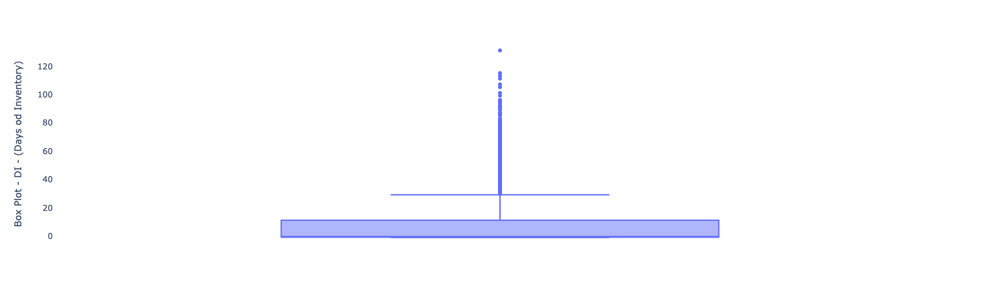

In [8]:
fig = px.box(df_detail_cars_inventory_train, y="DI")
fig.update_layout(
        yaxis_title='Box Plot - DI - (Days od Inventory)',
        xaxis=dict(showline=False, linecolor='rgb(204, 204, 204)', linewidth=2),
        yaxis=dict(showline=False, linecolor='rgb(204, 204, 204)', linewidth=2),
        plot_bgcolor='white'
    )
fig.show()

### - Survival function analysis
The estimated curve below is a step function, with steps occurring at time points when one or more cars were sold. In the graph, we can see that most cars are sold approximately 40 days after they enter inventory, as indicated by the steep incline slope of the estimated survival function in the first 40 days. Then we see that the more a car is in inventory, the probability of sale is reduced.

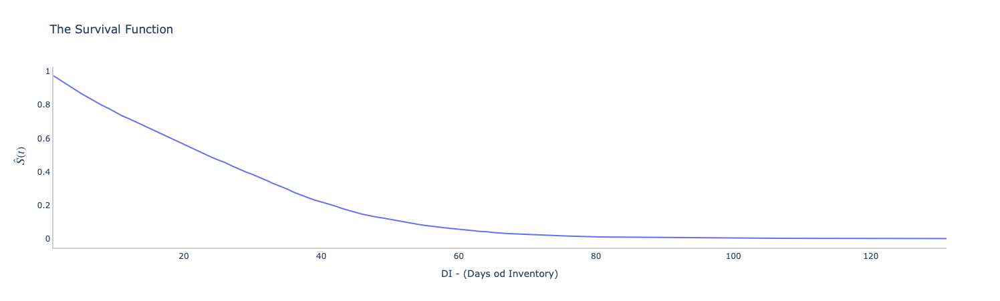

In [9]:
df_plot = df_detail_cars_inventory_train[df_detail_cars_inventory_train.sold.notnull()]
df_plot = df_plot.astype({'sold': np.bool, 'DI': 'int32'})
kaplan_meier_estimator_plot(df_plot, 'sold', 'DI')

However, for a more robust study of the survival function, it is necessary to stratify it by different variables that may have a possible effect on the function such as color, the type of transmission and body type. As can be seen in the following graphs, a difference is evident in the speed of a car's selling time by car type and model.

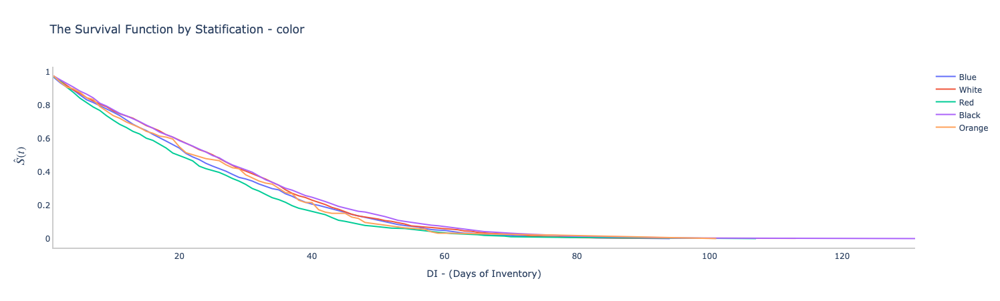

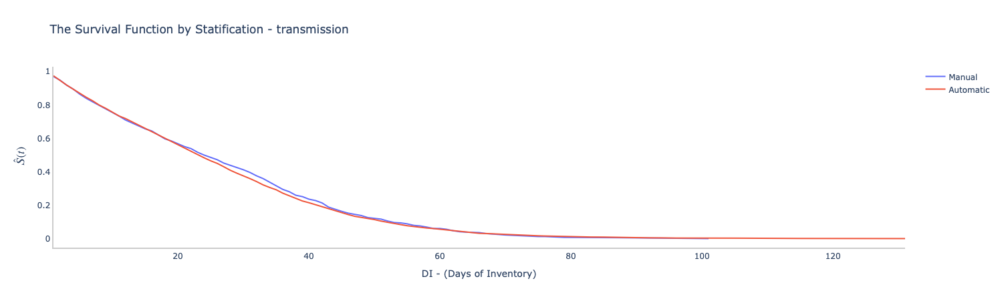

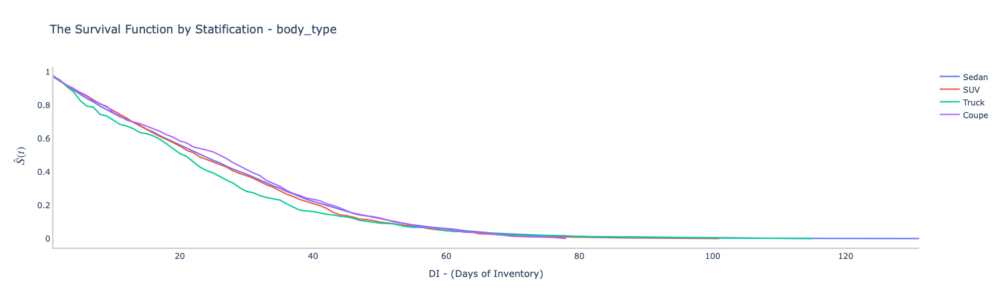

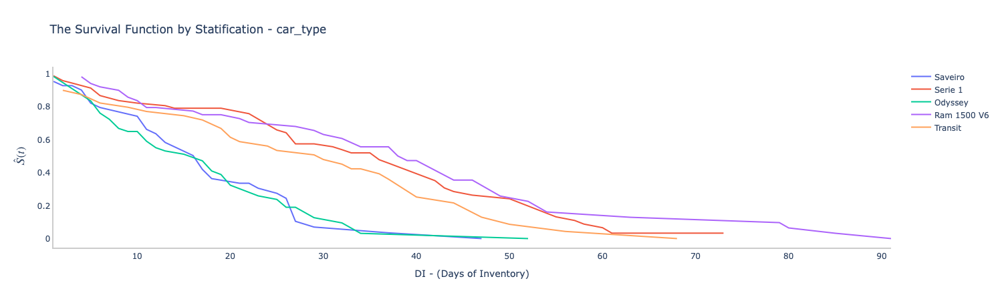

In [10]:
fetures = ['color', 'transmission', 'body_type']
for feature in fetures: 
    kaplan_meier_estimator_by_statification_plot(df_plot, 'sold', 'DI', feature)

fetures = ['car_type']
car_types = ['Serie 1', 'Ram 1500 V6', 'Odyssey', 'Transit', 'Saveiro']
df_aux = df_plot[df_plot['car_type'].isin(car_types)]
for feature in fetures: 
    kaplan_meier_estimator_by_statification_plot(df_aux, 'sold', 'DI', feature)
    
fetures = ['car_brand']
car_types = ['Nissan', 'Mercedes Benz', 'Chevrolet', 'Ford', 'Volkswagen']
df_aux = df_plot[df_plot['car_brand'].isin(car_types)]
#for feature in fetures: 
#    kaplan_meier_estimator_by_statification_plot(df_aux, 'sold', 'DI', feature)

### - Censured data analysis

23.749522718594886% of records are censored


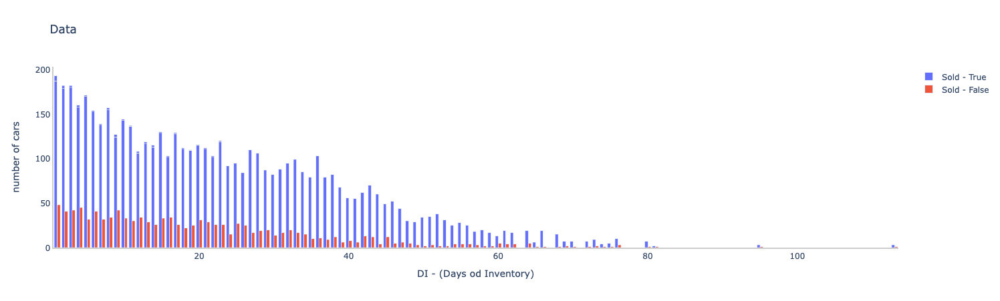

In [11]:
n_censored = df_detail_cars_inventory_train.sold.value_counts()[1] - df_detail_cars_inventory_train.sold.value_counts()[0]
print("{}% of records are censored".format(n_censored / df_detail_cars_inventory_train.shape[0] * 100))

df_detail_cars_listing_train_sum = df_detail_cars_inventory_train.reset_index().groupby(['sold', 'DI'], as_index=False).agg({'car_id': 'count'})

mask_sold = df_detail_cars_listing_train_sum.sold==True
fig = go.Figure()
fig = go.Figure(data=[
    go.Bar(name='Sold - True', x=df_detail_cars_listing_train_sum.DI, y=df_detail_cars_listing_train_sum.car_id[mask_sold]),
    go.Bar(name='Sold - False', x=df_detail_cars_listing_train_sum.DI, y=df_detail_cars_listing_train_sum.car_id[~mask_sold])
])
# Change the bar mode
fig.update_layout(
    barmode='group',
    title=f'Data',
    xaxis_title='DI - (Days od Inventory)',
    yaxis_title='number of cars',
    xaxis=dict(showline=True, linecolor='rgb(204, 204, 204)', linewidth=2),
    yaxis=dict(showline=True, linecolor='rgb(204, 204, 204)', linewidth=2),
    plot_bgcolor='white'
)
fig.show()

## Data Preprocessing

In [12]:
def data_preprocessing_with_tf(df=None, scaling_features=[], bucketized_features=[], categorical_features=[], embedding_features=[]):

    feature_columns = []
    feature_update_columns = []
    feature_layer_inputs = {}

     # - Scaling Numerical Inputs -> average_price, diff_price and diff_price_perc
    for feature in scaling_features:
        normalization_parameters = get_normalization_parameters(df, feature)
        feature_columns.append(create_feature_cols(feature, use_normalization=True, normalization_parameters=normalization_parameters))
        feature_layer_inputs[feature] = layers.Input(shape=(1,), dtype=tf.float32)
        
    # - Bucketized columns -> antiquity and km
    
    for feature in bucketized_features:
        tf_columns_aux = feature_column.numeric_column(feature)
        feature_bucket = feature_column.bucketized_column(tf_columns_aux, boundaries=[1, 3, 5])
        feature_update_columns.append(feature_bucket)
        feature_columns.append(feature_bucket)
    
    # - Transform Categorical Inputs to Numrical Inputs -> Color and transmission
    for feature in categorical_features:
        categorical_column = feature_column.categorical_column_with_vocabulary_list(feature, df[feature].unique())
        indicator_column = feature_column.indicator_column(categorical_column)
        feature_columns.append(indicator_column)
        feature_update_columns.append(categorical_column)
        feature_layer_inputs[feature] = tf.keras.Input(shape=(1,), name=feature, dtype=tf.string)


    # - Embedding columns -> car_brand and car_type
    for feature in embedding_features:
        categorical_columns = feature_column.categorical_column_with_vocabulary_list(feature, df[feature].unique())
        feature_update_columns.append(categorical_columns)
        
        embedding_column = feature_column.embedding_column(categorical_columns, dimension=30)
        feature_columns.append(embedding_column)
        

    # - Crossed feature columns -> card_brand, antiquity, km
    crossed_columns = feature_column.crossed_column(feature_update_columns, hash_bucket_size=100)
    feature_columns.append(feature_column.indicator_column(crossed_columns))
    
    return feature_columns, feature_update_columns, feature_layer_inputs

SCALING_FEATURES = ['average_price', 'diff_price', 'diff_price_perc'] + BUCKETIZED_FEATURES 
CATEGORICAL_COLUMNS = [
    'transmission', 
    'color', 
    'body_type'
] + EMBEDDING_COLUMNS 

feature_prepocessing = SCALING_FEATURES + CATEGORICAL_COLUMNS

feature_columns, feature_update_columns, feature_layer_inputs = data_preprocessing_with_tf(
    df=df_detail_cars_inventory_train,
    scaling_features=SCALING_FEATURES, 
    categorical_features=CATEGORICAL_COLUMNS,
)
feature_layer = tf.keras.layers.DenseFeatures(feature_columns)

feature_layer_outputs = feature_layer(feature_layer_inputs)
model = Model(inputs=[v for v in feature_layer_inputs.values()], outputs=[feature_layer_outputs])

predicted = model.predict([df_detail_cars_inventory_train[columns]for columns in feature_prepocessing])
df_preprocessed_train = pd.DataFrame(data=predicted, index=df_detail_cars_inventory_train.index)
df_preprocessed_train.columns = [f'ftt_{column}' for column in df_preprocessed_train.columns]
df_preprocessed_train = df_preprocessed_train.join(df_detail_cars_inventory_train[['sold', 'DI']], how='left')
df_preprocessed_train

,ftt_0,ftt_1,ftt_2,ftt_3,ftt_4,ftt_5,ftt_6,ftt_7,ftt_8,ftt_9,...,ftt_528,ftt_529,ftt_530,ftt_531,ftt_532,ftt_533,ftt_534,ftt_535,sold,DI
car_id,,,,,,,,,,,,,,,,,,,,,
0,-1.483790,-1.387316,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.483686,-1.574001,0.063147,1.0,0.0,<NA>,-1.0
112,-1.483790,-1.387316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.997103,0.505411,0.070423,1.0,0.0,<NA>,-1.0
1497,-1.483790,-1.387316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.284731,1.670347,-0.136314,1.0,0.0,<NA>,-1.0
1891,-1.483790,-1.387316,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.917779,0.184140,-0.387532,1.0,0.0,True,27.0
1955,-1.483790,-1.387316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.869751,-0.010383,0.037624,1.0,0.0,<NA>,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16468,0.075201,-1.592307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.128567,0.713787,-1.239008,0.0,1.0,<NA>,-1.0
16971,0.075201,-1.592307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.953833,-0.256496,-0.800467,0.0,1.0,<NA>,-1.0
17013,0.075201,-1.592307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.290990,1.615708,-0.990727,0.0,1.0,<NA>,-1.0


In [13]:
predicted = model.predict([df_detail_cars_inventory_validation[columns]for columns in feature_prepocessing])
df_preprocessed_validation = pd.DataFrame(data=predicted, index=df_detail_cars_inventory_validation.index)
df_preprocessed_validation.columns = [f'ftt_{column}' for column in df_preprocessed_validation.columns]
df_preprocessed_validation = df_preprocessed_validation.join(df_detail_cars_inventory_validation[['sold', 'DI']], how='left')
df_preprocessed_validation 

,ftt_0,ftt_1,ftt_2,ftt_3,ftt_4,ftt_5,ftt_6,ftt_7,ftt_8,ftt_9,...,ftt_528,ftt_529,ftt_530,ftt_531,ftt_532,ftt_533,ftt_534,ftt_535,sold,DI
car_id,,,,,,,,,,,,,,,,,,,,,
19780,-1.483790,-1.387316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.255195,1.550721,0.095966,1.0,0.0,True,7.0
1123,0.075201,-0.480468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,-0.316816,-1.150516,0.115952,0.0,1.0,True,21.0
7124,0.075201,-0.480468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.088065,1.439107,0.335701,0.0,1.0,True,3.0
7314,0.075201,-0.480468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.643134,0.618965,0.115139,0.0,1.0,True,10.0
10375,0.075201,-0.480468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.132797,-0.811313,-0.179648,0.0,1.0,True,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9010,1.374361,0.306395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,-0.010127,0.216209,-1.078927,0.0,1.0,True,31.0
12055,0.594865,-0.805537,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.300611,1.811385,0.109733,1.0,0.0,True,26.0
17219,0.594865,-0.805537,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.876630,0.840163,0.158155,1.0,0.0,True,24.0


## Modeling

### - Autoencoder
#### As a technique to handle the problem of outliers present in the data set, it is proposed to also use Autoencoder. It should learn the underlying structure but forget the noise in the data.

In [14]:
logging.info('A utility method to create a tf.data dataset from a Pandas Dataframe')
feature_prepocessing_encoder = SCALING_FEATURES
batch_size = len(df_detail_cars_inventory_train) 
train_ds = df_to_dataset_enc(df_aux, feature_prepocessing_encoder, batch_size=batch_size)
for feature_batch, label_batch in train_ds.take(1):
    print('Every feature:', list(feature_batch.keys()))
    print('A batch of targets:', label_batch )
example_batch = next(iter(train_ds))[0]


feature_columns_autoencoder = []
for feature in feature_prepocessing_encoder:
    normalization_parameters = get_normalization_parameters(df_detail_cars_inventory_train, feature)
    feature_columns_autoencoder.append(create_feature_cols(feature, use_normalization=False, normalization_parameters=normalization_parameters))


num_epochs = 500
bacth_size = len(df_detail_cars_inventory_train)/10
layer_name = 'hidden_layer'

logging.info('Autoencoder')
logging.info('Create a feature layer')
feature_layer = tf.keras.layers.DenseFeatures(feature_columns=feature_columns_autoencoder, name='hidden_layer')

n_fetures = len(df_preprocessed_validation)
logging.info('Train autoencoder')
model = tf.keras.Sequential([
    feature_layer,
        Dense(units=(n_fetures*1.5), activation='linear', activity_regularizer=regularizers.l1(10e-5)),
    Dropout(0.02),
    Dense(units=n_fetures, activation='linear')
]) 

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])
#history = model.fit( x=train_ds, batch_size=bacth_size, shuffle=True, verbose=1, epochs=num_epochs)
#df_encoder = get_autoencoder_features(example_batch)

#df_inventory_encoder = df_preprocessed_train.join(df_encoder, how='left')
df_inventory_encoder = df_preprocessed_train

2021-06-01 00:00:15,431 - INFO - A utility method to create a tf.data dataset from a Pandas Dataframe
2021-06-01 00:00:15,471 - INFO - Autoencoder
2021-06-01 00:00:15,472 - INFO - Create a feature layer
2021-06-01 00:00:15,473 - INFO - Train autoencoder


Every feature: ['average_price', 'diff_price', 'diff_price_perc', 'antiquity', 'km']
A batch of targets: tf.Tensor(
[[ 3.57987000e+05 -3.37000000e+03 -9.41374966e-03  1.00000000e+01
   1.07715800e+07]
 [ 1.06132000e+05 -1.47430000e+04 -1.38911921e-01  4.00000000e+00
   1.39601830e+07]
 [ 4.42804000e+05 -2.90870000e+04 -6.56882052e-02  1.20000000e+01
   9.87322200e+06]
 ...
 [ 5.87731000e+05 -2.35130000e+04 -4.00063975e-02  2.00000000e+00
   2.30413870e+07]
 [ 5.41807000e+05 -2.17920000e+04 -4.02209643e-02  9.00000000e+00
   7.42363100e+06]
 [ 4.69427000e+05 -7.73790000e+04 -1.64837131e-01  3.00000000e+00
   3.19700220e+07]], shape=(2152, 5), dtype=float64)


In [15]:
logging.info('A utility method to create a tf.data dataset from a Pandas Dataframe')
batch_size = len(df_detail_cars_inventory_validation) 

df_aux = df_detail_cars_inventory_validation.copy()
df_aux = df_aux[feature_prepocessing + ['DI']].reset_index()
train_ds = df_to_dataset(df_aux, 'DI', batch_size=batch_size)

for feature_batch, label_batch in train_ds.take(1):
    print('Every feature:', list(feature_batch.keys()))
    print('A batch of targets:', label_batch )

example_batch = next(iter(train_ds))[0]
#df_encoder_validation = get_autoencoder_features(example_batch)
#df_inventory_encoder_validation = df_preprocessed_validation.join(df_encoder_validation, how='left')
df_inventory_encoder_validation = df_preprocessed_validation


2021-06-01 00:00:15,545 - INFO - A utility method to create a tf.data dataset from a Pandas Dataframe


Every feature: ['car_id', 'average_price', 'diff_price', 'diff_price_perc', 'antiquity', 'km', 'transmission', 'color', 'body_type', 'car_brand', 'car_type']
A batch of targets: tf.Tensor([14.  8. 22. ... 29. 31. 16.], shape=(1666,), dtype=float64)


### - Build model with TPOT
- ensemble:
    - ExtraTreesRegressor
    - GradientBoostingRegressor
    - AdaBoostRegresor
    - RandomForestRegressor
- linear model:
    - ElasticNetCV
    - LassoLarsCV
    - RidgeCV
    - SGDRegressor
- neighbords:
    - KNeighborsRegressor
- svm:
    - LinearSVR
- tree
    - DecisionTreeRegressor
- xgbost
    - XGBRegressor

In [16]:
df_inventory_with_info = df_inventory_encoder[df_inventory_encoder['sold'].notna()]
y_train = df_inventory_with_info[['DI']]
X_train = df_inventory_with_info.copy().drop(columns=['sold', 'DI'])

#neg_median_absolute_error
#tpot = TPOTRegressor(generations=5, population_size=50, cv=10, max_time_mins=1, random_state=123, verbosity=3, config_dict=None, scoring='neg_mean_absolute_error')
tpot = TPOTRegressor(generations=5, population_size=50, cv=10, max_time_mins=10, random_state=123, verbosity=3, config_dict=REGRESSOR_CONFIG_DICT)


tpot.fit(X_train, y_train)
#TPOT
#TPOT sparse'
#tpot.export('tpot_boston_pipeline.py')

12 operators have been imported by TPOT.


/Users/marialanza/Documents/ProjectsML_MF/mfrancys/venv/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Optimization Progress:   0%|          | 0/50 [00:00<?, ?pipeline/s]


11.38 minutes have elapsed. TPOT will close down.
TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.


TPOTRegressor(config_dict={'sklearn.ensemble.AdaBoostRegressor': {'learning_rate': [0.001,
                                                                                    0.01,
                                                                                    0.1,
                                                                                    0.5,
                                                                                    1.0],
                                                                  'loss': ['linear',
                                                                           'square',
                                                                           'exponential'],
                                                                  'n_estimators': [100]},
                           'sklearn.ensemble.ExtraTreesRegressor': {'bootstrap': [True,
                                                                                  False],
                      

In [17]:
best_estimator = tpot.fitted_pipeline_
best_estimator 

logging.info('Model Validation')
y_validation = df_inventory_encoder_validation[['DI']].astype('int32')
X_validation = df_inventory_encoder_validation.copy().drop(columns=['sold', 'DI'])
preds = pd.DataFrame(data=tpot.predict(X_validation), index=X_validation.index, columns=['preds']).astype('int32')
df_aux = preds.join(y_validation, how='left').astype('int32')
RMSE = (((df_aux['preds'] - df_aux['DI'])**2).mean())**.5
MAPE = ((df_aux['preds'] - df_aux['DI']).abs()/df_aux['preds']).mean()



2021-06-01 00:11:39,751 - INFO - Model Validation


In [18]:
print(f'MAPE: {MAPE}')
print(f'RMSE: {RMSE}')

MAPE: 0.5892598320840977
RMSE: 16.142132057784323


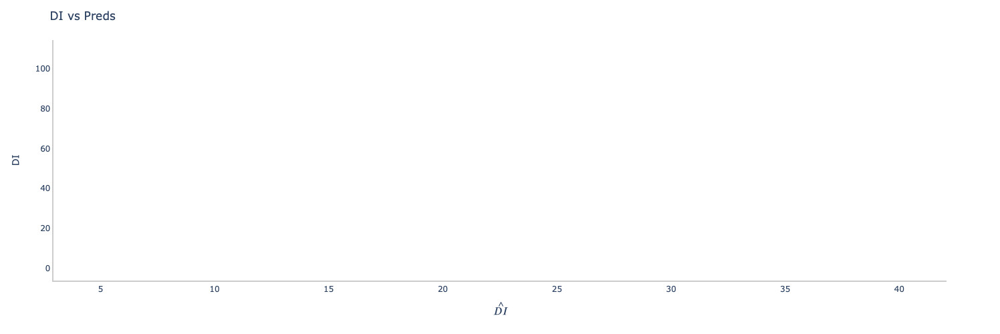

In [19]:
fig = px.scatter(df_aux, x='preds', y="DI")
fig.update_layout(
    title=f'DI vs Preds',
    xaxis_title='$\hat{DI}$',
    yaxis_title='DI',
    xaxis=dict(showline=True, linecolor='rgb(204, 204, 204)', linewidth=2),
    yaxis=dict(showline=True, linecolor='rgb(204, 204, 204)', linewidth=2),
    plot_bgcolor='white',
    width=500,
    height=500,
)
fig.show()

### REPORT

In [24]:
df_inventory_without_info = df_inventory_encoder[df_inventory_encoder['sold'].isna()]
y_test = df_inventory_without_info[['DI']]
X_test = df_inventory_without_info.copy().drop(columns=['sold', 'DI'])

sample_submission = pd.DataFrame(data=tpot.predict(X_test), columns=['di']).astype('int32')
sample_submission['car_id'] = X_test.index
sample_submission.to_csv('submission.csv', index=None)
sample_submission

,di,car_id
0,17,0
1,21,112
2,21,1497
3,20,1955
4,16,2435
...,...,...
11668,13,16169
11669,14,16468
11670,15,16971
11671,14,17013
